<a href="https://colab.research.google.com/github/ge293283/python_basics/blob/main/kirill_ge/nnpe_project/_codeTesting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Тесты



### Исходные данные

*   /content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/NSCLC-Radiomics - каталог с папками срезов (.dcm) пациентов с 5 по 9
* /content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/metadata.csv - Функции сегментации и метаданные изображений (.csv)
*   /content/drive/MyDrive/pleural_effusion/dataset_test/project_data/Effusions - cегментация плеврального выпота (.nii.gz) пациентов с 5 по 9 (5 - 3 осмотра и 8 - 2 осмотра пациент)
* /content/drive/MyDrive/pleural_effusion/dataset_test/project_data/Thoracic_Cavities - сегментация грудной клетки (.nii.gz) пациентов с 5 по 9 (9 - 2 осмотра)
---
* /content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pericardeffusion/imagesTr - сторонняя база 1, снимки (.nii.gz) пациентов с 1 по 3
* /content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pericardeffusion/labelsTr - сторонняя база 1, разметка/лейблы (.nii.gz) пациентов с 1 по 3
* /content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pleuraleffusion_radpath_down - сторонняя база 2, снимки (S_000x_ct) (.nii.gz) и разметка/лейблы (S_000x_label) (.nii.gz) пациентов с 1 по 3
* /content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pleuraleffusion_radpath_down/radpath_pub.xlsx - данные для базы 2 (.xlsx)

[Подробнее](https://github.com/alecseiterr/pleural_effusion/blob/main/kirill_ge/data/readme_data.md)


## Необходимые инструменты/данные

In [ ]:
# Устанавливаем пакеты
!pip install pydicom  # библиотека, предназначенная для работы с файлами формата DICOM
!pip install dicom2nifti  # библиотека для конвертации медицинских изображений из формата DICOM в формат NIfTI
# !pip install scikit-image # библиотека для обработки изображений
# !pip install -U scikit-image  # обновление

In [ ]:
# Подключаем все используемые библиотеки
from google.colab import drive
drive.mount('/content/drive')

from google.colab import auth
from google.cloud import storage
auth.authenticate_user()
storage_client = storage.Client()

import os
import numpy as np
import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import h5py

import pydicom  # библиотека, предназначенная для работы с файлами формата DICOM
import nibabel as nib # библиотека для работы с медицинскими изображениями и данными в формате NIfTI
import dicom2nifti  # библиотека для конвертации медицинских изображений из формата DICOM в формат NIfTI

# 4. Cropping the Region of Interest (ROI) using Otsu’s binarization and other methods
# https://medium.com/mlearning-ai/covid-19-infection-and-lung-segmentation-using-ct-scans-a5ab5b379272
from skimage.filters import threshold_otsu  # метод пороговой обработки изображений с использованием алгоритма Оцу
# Отсечение внешнего воздуха
# https://habr.com/ru/companies/inobitec/articles/458268/#paragraph6

# from scipy.ndimage import binary_erosion  # морфологическая эрозия (erosion, размывание)
# from scipy.ndimage import binary_dilation # морфологическая дилатация (dilation, расширение)

# import shutil # библиотека для работы с файлами и папками
# from glob import glob # библиотека для поиска файлов, создания списков файлов и каталогов

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Переменные

# Путь для сохранения файлов (.nii.gz)
folderPath_output = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/output/"
# Исходные изображения КТ (.dcm) /LUNG1-00*num patient*/*folder*/*.dcm
folderPath_originalCT = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/NSCLC-Radiomics/"
# Cегментация плеврального выпота (.nii.gz) пациентов с 5 по 9 (5 - 3 осмотра и 8 - 2 осмотра пациент)
folderPath_effusions = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/Effusions/"
# Cегментация грудной клетки (.nii.gz) пациентов с 5 по 9 (9 - 2 осмотра)
folderPath_thoracicСavity = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/Effusions/"
# Функции сегментации и метаданные изображений
metadataOriginalCT= "/content/drive/MyDrive/pleural_effusion/nnpe_project/Thoracic and Pleural Effusion Segmentations April 2020.csv"

# Исходные КТ пациента 005
folderPath_005 = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/NSCLC-Radiomics/LUNG1-005/01-01-2014-StudyID-NA-93819/1.000000-NA-68747/"
# 1-01.dcm из исходных КТ, пациента 005
dcmFile_005_101 = "/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/NSCLC-Radiomics/LUNG1-005/01-01-2014-StudyID-NA-93819/1.000000-NA-68747/1-01.dcm"

# Cторонняя база 1, снимки (.nii.gz) пациентов с 1 по 3
other1_folderPath_images = "/content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pericardeffusion/imagesTr/"
# Cторонняя база 1, разметка/лейблы (.nii.gz) пациентов с 1 по 3
other1_folderPath_labels = "/content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pericardeffusion/labelsTr/"

# Cторонняя база 2, снимки (S_000x_ct) (.nii.gz) и разметка/лейблы (S_000x_label) (.nii.gz) пациентов с 1 по 3
other2_folderPath = "/content/drive/MyDrive/pleural_effusion/dataset_test/other_data/pleuraleffusion_radpath_down/"

In [ ]:
# Функции

# Функция для сравнения и вывода срезов КТ и соответствующей маски
def outputSlices_ctMask(ct, mask, slice_index, figsize=(20, 5), set_title_ct="ct", set_title_mask="mask"):
    """
    Отображает срезы КТ и маски для заданного индекса среза.

    Параметры:
    - ct (ndarray): Массив срезов исходного КТ.
    - mask (ndarray): Массив срезов маски (label).
    - slice_index (int): Индекс среза для отображения.
    - figsize (tuple): Размер фигуры (по умолчанию: (20, 5)).

    Возвращает:
    - fig (Figure): Полотно с графиком.
    - axs (Axes): Подграфики с изображениями.

    Пример использования:
    ct_data = ...
    mask_data = ...
    fig, axs = outputSlices_CTmask(ct_data, mask_data, 20)
    plt.show()
    """
    ct_slice = ct[:, :, slice_index]
    mask_slice = mask[:, :, slice_index]
    # Создадим полотно для 2-х изображений срезов расположенных в 1-у строку
    fig, axs = plt.subplots(1, 4, figsize=figsize)

    # Отображение среза исходного КТ
    axs[0].imshow(np.rot90(ct_slice), cmap='gray')
    axs[0].set_title(set_title_ct)
    axs[0].set_xticks([])
    axs[0].set_yticks([])

    # Отображение маски
    axs[1].imshow(np.rot90(mask_slice), cmap='gray')
    axs[1].set_title(set_title_mask)
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    # Отображение среза исходного КТ
    axs[2].imshow(np.rot90(ct_slice), cmap='gray')
    axs[2].set_title(set_title_ct)
    axs[2].grid(True)

    # Отображение маски
    axs[3].imshow(np.rot90(mask_slice), cmap='gray')
    axs[3].set_title(set_title_mask)
    axs[3].grid(True)

    fig.suptitle(f"Сравнение срезов КТ и маски. Срез № {slice_index}")
    plt.show()
    print()

    return fig, axs

# Функция применения метода Otsu
def applyOtsu(tensorIsDictToBinary,
              nameTensor,
              saveMaskToDict=True,
              dictForTensor={},
              saveMaskToNifti=False,
              niftiFilePath=None,
              binaryMaskOutputPath=None):
    """
    Применяет метод Оцу для бинаризации входного тензора и сохраняет результаты в словарь и/или в файл формата NIfTI.

    Аргументы:
    - tensorIsDictToBinary: Входной тензор, который требуется бинаризовать.
    - nameTensor: Имя тензора.
    - saveMaskToDict: Флаг, указывающий, нужно ли сохранить бинарную маску в словарь. По умолчанию True.
    - dictForTensor: Словарь, в который сохраняется бинарная маска. По умолчанию пустой словарь.
    - saveMaskToNifti: Флаг, указывающий, нужно ли сохранить бинарную маску в файл формата NIfTI. По умолчанию False.
    - niftiFilePath: Путь к NIfTI-файлу для получения аффинного преобразования. Обязателен, если saveMaskToNifti=True.
    - binaryMaskOutputPath: Путь для сохранения бинарной маски в формате NIfTI. Обязателен, если saveMaskToNifti=True.

    Возвращает:
    Ничего не возвращает.
    """

    # Получим nifti файл для affine
    niftiFileForAffine = nib.load(niftiFilePath)

    # Применение метода Оцу для бинаризации
    thresholdValue = threshold_otsu(tensorIsDictToBinary)
    binaryMask = tensorIsDictToBinary > thresholdValue
    binaryMask_int = binaryMask.astype(int) # Уточнить необходимость при создании нифти (вроде необходима)

    if saveMaskToDict:
        # Сохранение бинарной маски в словарь
        dictForTensor[nameTensor] = binaryMask

    if saveMaskToNifti:
        # Создание нового объекта NIfTI с бинарной маской
        newNiftiFile_mask = nib.Nifti1Image(binaryMask_int, niftiFileForAffine.affine)
        # Создадим папку для output, если ее нет
        os.makedirs(os.path.dirname(binaryMaskOutputPath), exist_ok=True)
        # Сохранение бинарной маски в формате NIfTI
        nib.save(newNiftiFile_mask, binaryMaskOutputPath)

# Функция применения морфологической эрозии (erosion, размывание)
def applyErosion(binary_tensor, erosion_size):
    eroded_tensor = binary_erosion(binary_tensor, structure=np.ones((erosion_size, erosion_size, erosion_size)))
    return eroded_tensor

# Функция применения морфологической дилатации (dilation, расширение)
def applyDilation(binary_tensor, dilation_size):
    dilated_tensor = binary_dilation(binary_tensor, structure=np.ones((dilation_size, dilation_size, dilation_size)))
    return dilated_tensor

# Функция приведения трехмерных массивов к единому размеру
def reducingArrayTo_commonShape(arrayToReshape_ct, arrayToReshape_mask):
    """
    Изменяет размерность трехмерных массивов до общей формы (512, 512, 300).

    Аргументы:
    - arrayToReshape_ct (ndarray): Исходный трехмерный массив, представляющий исходные данные CT.
    - arrayToReshape_mask (ndarray): Исходный трехмерный массив, представляющий маску.

    Возвращает:
    - correctArray_ct (ndarray): Корректированный трехмерный массив для CT.
    - correctArray_mask (ndarray): Корректированный трехмерный массив для маски.
    """

    # Задаем необходимую размерность
    correctShape = (512, 512, 256)

    # Вычисление количества срезов, которые нужно добавить сверху и снизу
    topNum = int((correctShape[2] - arrayToReshape_ct.shape[2]) / 2)
    downNum = topNum

    # Проверка, имеет ли число 5 десятых (один знак после запятой)
    if (topNum * 10) % 1 == 0.5:
        topNum = int(topNum - 0.5)
        downNum = int(topNum + 0.5)

    # Применение дополнения к исходным массивам с использованием np.pad()
    correctArray_ct = np.pad(arrayToReshape_ct, ((0, 0), (0, 0), (topNum, downNum)), mode='constant')
    correctArray_mask = np.pad(arrayToReshape_mask, ((0, 0), (0, 0), (topNum, downNum)), mode='constant')

    return correctArray_ct, correctArray_mask

###Метаданные срезов



PatientID Carcinoma.Laterality  GTV1  GTV2  GTV3  GTV4  GTV5  GTV6  Tumor.Location  Effusion.Event Primary.Effusion.Reviewer Secondary.Effusion.Reviewer Tertiary.Effusion.Reviewer  Right.Pleural.Effusion.Volume Left.Pleural.Effusion.Volume  RO1-Rad4.Effusion.DSC  Rad3-Rad4.Effusion.DSC  RO1-Rad3.Effusion.DSC  Thorax.Recontour.Time  Auto-MS.Thorax.DSC Primary.Thorax.Reviewer Secondary.Thorax.Reviewer  Right.Thorax.Volume  Left.Thorax.Volume  RO1-RO3.Thorax.DSC  Rad1-Rad3.Thorax.DSC  Rad1-Rad2.Thorax.DSC  RO2-Rad2.Thorax.DSC  Dim.x  Dim.y  Dim.z  Voxel.Space.x  Voxel.Space.y  Voxel.space.z
LUNG1-005                    R 78.62   NaN   NaN   NaN   NaN   NaN             1.0             1.0                      Rad4                        Rad3                        RO1                          128.5                          NaN                0.25891                0.409617               0.101639                    NaN            0.991355                     RO1                       NaN   

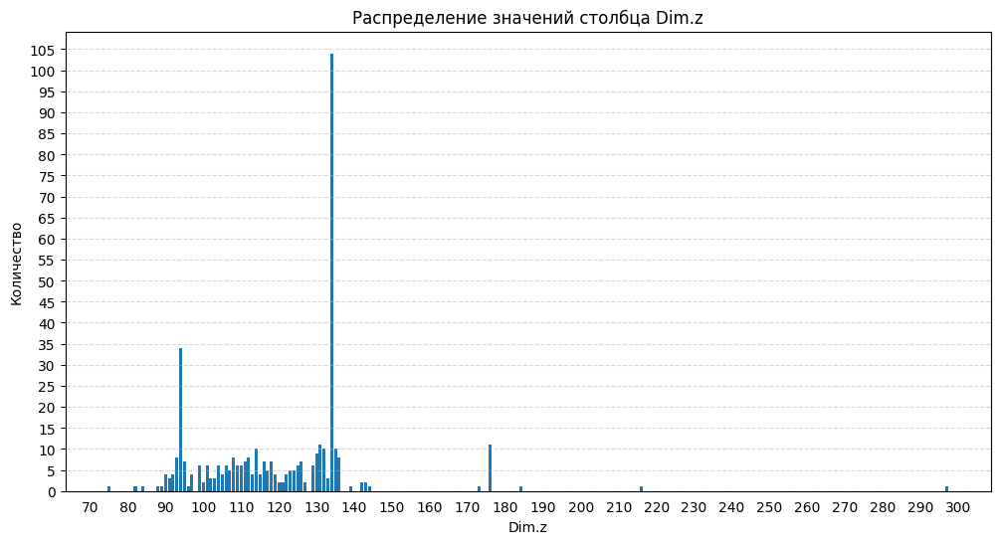

In [ ]:
# Вывод данных с 5 по 9 пциентов из файла с метаданные исходных КТ
metadataOriginalCT_pd = pd.read_csv(metadataOriginalCT)
print(metadataOriginalCT_pd.iloc[4:9].to_string(index=False))

# Посмотрим максимальные и минимальные значения размерностей по осям из файла с метаданных исходных КТ
max_valueDimX = metadataOriginalCT_pd['Dim.x'].max()
min_valueDimX = metadataOriginalCT_pd['Dim.x'].min()
max_valueDimY = metadataOriginalCT_pd['Dim.y'].max()
min_valueDimY = metadataOriginalCT_pd['Dim.y'].min()
max_valueDimZ = metadataOriginalCT_pd['Dim.z'].max()
min_valueDimZ = metadataOriginalCT_pd['Dim.z'].min()
max_valueVoxelZ = metadataOriginalCT_pd['Voxel.space.z'].max()
min_valueVoxelZ = metadataOriginalCT_pd['Voxel.space.z'].min()

print(f"Dim.x: max {max_valueDimX}, min {min_valueDimX}")
print(f"Dim.y: max {max_valueDimY}, min {min_valueDimY}")
print(f"Dim.z: max {max_valueDimZ}, min {min_valueDimZ}\n")
print(f"Voxel.space.z: max {max_valueVoxelZ}, min {min_valueVoxelZ}\n")

sorted_df = metadataOriginalCT_pd.sort_values(by='Dim.z', ascending=False)
sorted_df.head(10)

unique_values, value_counts = sorted_df['Dim.z'].value_counts().index, sorted_df['Dim.z'].value_counts().values
# Создание столбчатой диаграммы
plt.figure(figsize=(12, 6))
plt.bar(unique_values, value_counts)

# Настройка шкалы и сетки
plt.tick_params(axis='x', which='both', bottom=False, top=False)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.locator_params(axis='x', nbins=30)
plt.locator_params(axis='y', nbins=30)

plt.xlabel('Dim.z')
plt.ylabel('Количество')
plt.title('Распределение значений столбца Dim.z')
plt.show()

### Просмотр dicom

In [ ]:
# Создадим пустой список для записи пиксельные данных
slice_005_101 = []
# Читаем dcm
dcmToarr = pydicom.dcmread(dcmFile_005_101)
# Дабавляем данные в список
slice_005_101.append(dcmToarr.pixel_array)

# Посмотри что лежит в середине массива
middle = len(slice_005_101[0]) // 2  # Находим середину массива
middle_slice = slice_005_101[0][middle-5:middle+5]  # Выбираем 10 элементов вокруг середины

print(np.shape(slice_005_101))
print(slice_005_101[0].shape)
print(middle_slice)

(1, 512, 512)
(512, 512)
[[-1024 -1024 -1017 ... -1011 -1020 -1024]
 [-1024 -1024 -1024 ... -1019 -1011 -1024]
 [-1024 -1011 -1018 ... -1016 -1022 -1024]
 ...
 [-1024 -1014 -1015 ... -1014 -1011 -1024]
 [-1024 -1019 -1024 ... -1017 -1007 -1024]
 [-1024 -1024 -1021 ...  -996  -986 -1024]]


### Конвертация dcm в nii с использование библиотеки nibabel

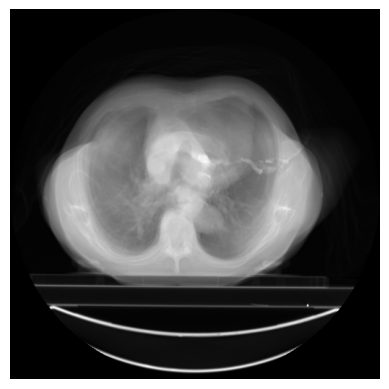

Patient ID: LUNG1-005
Study Date: 20140101
Modality: CT
Pixel Spacing: [0.9770, 0.9770]
Image Shape: (512, 512)
Количество срезов: 91
Размерность трехмерного массива: (91, 512, 512)
Минимальное значение: -1024
Максимальное значение: 3071
Среднее значение: -710.0465159154201


In [ ]:
# # Создадим пустой список для харанения названий файлов с расширением .dcm
# files_dcm_LUNG1005 = []
# # Список для хранения данных срезов
# slices_LUNG1005 = []

# # Циклом пройдемся по файлам, которые лежат в папке со снимаками пациента 005
# for files in os.listdir(folderPath_005):
#   files_path = os.path.join(folderPath_005, files)  # Получаем полный путь к файлу
#   if os.path.isfile(files_path) and files.endswith('.dcm'): # Проверяем является ли текущий элемент файлом c расширением .dcm
#     dcmToarr = pydicom.dcmread(files_path)  # Если файл подходит, читаем
#     slices_LUNG1005.append(dcmToarr.pixel_array)  # Добавляем пиксельные данные среза в список
#     files_dcm_LUNG1005.append(files)  # Добавляем название файла в список

# # Преобразование срезов в трехмерный массив
# volume = np.stack(slices_LUNG1005)

# # Создание объекта NIfTI из трехмерного массива volume
# nii_img = nib.Nifti1Image(volume, affine=np.eye(4))

# # Путь для сохранения файла NIfTI
# outputPath_LUNG1005 = folderPath_originalCT + 'Output/005.nii'

# # Создание директории, если она не существует
# os.makedirs(os.path.dirname(outputPath_LUNG1005), exist_ok=True)

# # Сохранение NIfTI в файл
# nib.save(nii_img, outputPath_LUNG1005)

# # Вывод общего изображения срезов
# plt.imshow(np.sum(volume, axis=0), cmap='gray')
# plt.axis('off')
# plt.show()

# # Вывод информации
# first_ds = pydicom.dcmread(os.path.join(folderPath_005, files_dcm_LUNG1005[0]))
# print(f"Patient ID: {first_ds.PatientID}")
# print(f"Study Date: {first_ds.StudyDate}")
# print(f"Modality: {first_ds.Modality}")
# print(f"Pixel Spacing: {first_ds.PixelSpacing}")
# print(f"Image Shape: {first_ds.pixel_array.shape}")
# print(f"Количество срезов: {len(slices_LUNG1005)}")

# # Вывод информации о трехмерном массиве volume
# print(f"Размерность трехмерного массива: {volume.shape}")
# print(f"Минимальное значение: {np.min(volume)}")
# print(f"Максимальное значение: {np.max(volume)}")
# print(f"Среднее значение: {np.mean(volume)}")

Размеры данных: (91, 512, 512)
Расстояние между пикселями: [1. 1. 1.]


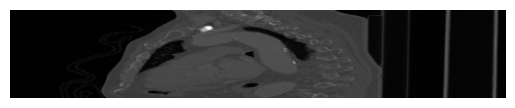

In [ ]:
# # Создание nii
# nifti_image = nib.Nifti1Image(volume, affine=np.eye(4))

# output_path = '/content/drive/MyDrive/Базы/output.nii.gz'

# # Сохранение nii
# nib.save(nifti_image, output_path)

# # Загрузка nii
# nifti_data = nib.load(output_path)

# # Вывод информации
# print(f"Размеры данных: {nifti_data.shape}")
# print(f"Расстояние между пикселями: {nifti_data.header['pixdim'][1:4]}")

# # Визуализация
# data = nifti_data.get_fdata()
# plt.imshow(data[:, :, data.shape[2] // 2], cmap='gray')
# plt.axis('off')
# plt.show()

In [ ]:
# nii_file = nib.load("/content/drive/MyDrive/Базы/output.nii.gz")
# shape = nii_file.shape
# print(shape)

(91, 512, 512)


In [ ]:
# dcm_file = pydicom.dcmread("/content/drive/MyDrive/Базы/1.000000-NA-68747/1-02.dcm")
# shape = dcm_file.pixel_array.shape
# print(shape)

(512, 512)


### Конвертация и чтение с применением библиотеки dicom2nifti и nibabel
[How to Convert Series of Dicom Files into Nifti using Python (видео)](https://www.youtube.com/watch?v=rtUSole1PaQ)

In [ ]:
# # Путь для сохранения файла NIfTI
# outputPath_LUNG1005 = folderPath_originalCT + 'Output/test_dicom2nifti005.nii.gz'
# # Создание директории, если она не существует
# os.makedirs(os.path.dirname(outputPath_LUNG1005), exist_ok=True)
# # Сздание файла NIfTI
# dicom2nifti.dicom_series_to_nifti(folderPath_005, outputPath_LUNG1005)

{'NII_FILE': '/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/NSCLC-Radiomics/Output/test_dicom2nifti005.nii.gz',
 'NII': <nibabel.nifti1.Nifti1Image at 0x7f4ddd3abd60>,
 'MAX_SLICE_INCREMENT': 3.0}

In [ ]:
# # Посмотрим что за файл, который мы создали - test_dicom2nifti005.nii.gz
# niftiFile_005 = nib.load(outputPath_LUNG1005)
# fdata_niftiFile_005 = niftiFile_005.get_fdata()

# # np_niftiFile_005 = np.unique(fdata_niftiFile_005)
# # np_niftiFile_005

# # print(fdata_niftiFile_005)
# # print(fdata_niftiFile_005.shape)
# # print(type(fdata_niftiFile_005))
# # print()
# # print()
# # print(np_niftiFile_005)
# # print(np_niftiFile_005.shape)
# # print()
# # print()
# # print(niftiFile_005)

In [ ]:
# # Посмотрим на файл содержайщий lable
# outputPath_LUNG1005lb = folderPath_effusions + "LUNG1-005/LUNG1-005_effusion_first_reviewer.nii.gz"

# niftiFile_005lb = nib.load(outputPath_LUNG1005lb)
# fdata_niftiFile_005lb = niftiFile_005lb.get_fdata()

# # np_niftiFile_005lb = np.unique(fdata_niftiFile_005lb)


# # print(fdata_niftiFile_005lb)
# # print(fdata_niftiFile_005lb.shape)
# # print(type(fdata_niftiFile_005lb))
# # print()
# # print()
# # print(np_niftiFile_005lb)
# # print(np_niftiFile_005lb.shape)
# # print()
# # print()
# # print(niftiFile_005lb)

## Нормализация данных

In [ ]:
# Нормализация данных исходного КТ
# np_niftiFile_005 представляет собой массив данных КТ 5 пациента
# np_niftiFile_005_normalization = np_niftiFile_005 / 4095
# print(np_niftiFile_005_normalization)
# print(np.max(np_niftiFile_005_normalization))
# print(np.min(np_niftiFile_005_normalization))

[-0.25006105 -0.24981685 -0.24957265 ...  0.74945055  0.74969475
  0.74993895]
0.7499389499389499
-0.25006105006105006


In [ ]:
# # Нормализация данных исходного КТ в пределах от 0 до 1
# np_niftiFile_005_normalization01 = (np_niftiFile_005 - np.min(np_niftiFile_005)) / (np.max(np_niftiFile_005) - np.min(np_niftiFile_005))
# print(np_niftiFile_005_normalization01)
# print(np.max(np_niftiFile_005_normalization01))
# print(np.min(np_niftiFile_005_normalization01))

[0.00000000e+00 2.44200244e-04 4.88400488e-04 ... 9.99511600e-01
 9.99755800e-01 1.00000000e+00]
1.0
0.0


## Соранение данных в формате h5

In [ ]:
# Соранение данных в формате h5
# import h5py

# output_dir = os.path.join(folderPath_output, "h5")
# os.makedirs(output_dir, exist_ok=True)

# for root, dirs, files in os.walk(folderPath_output):
#     for file in files:
#         if file.endswith('.nii.gz'):
#             nifti_path = os.path.join(root, file)
#             tensor_name = "LUNG_" + (os.path.splitext(file)[0][6:-4])

#             nifti_file = nib.load(nifti_path)
#             nifti_data = nifti_file.get_fdata()

#             # Создание отдельного файла HDF5 в папке "h5" для каждого тензора
#             with h5py.File(os.path.join(output_dir, f"{tensor_name}.h5"), 'w') as hdf_file:
#                 hdf_file.create_dataset(tensor_name, data=nifti_data)

#             print(f"Тензор {tensor_name} сохранен в файле {tensor_name}.h5 в папке {output_dir}")

In [ ]:
!pip install nilearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 54.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 63.1 MB/s eta 0:00:00
  Attempting uninstall: nibabel
    Found existing installation: nibabel 3.0.2
    Uninstalling nibabel-3.0.2:
      Successfully uninstalled nibabel-3.0.2


## Препроцессинг данных

In [ ]:
# # # Конвертирование dicom в nifti

# # Получение списка подпапок в папке folderPath_originalCT
# patient_folders = []
# for entry in os.scandir(folderPath_originalCT):
#     if entry.is_dir() and not entry.name.startswith('.'):
#         patient_folders.append(entry.path)
# # print(patient_folders)

# # Цикл для обхода подпапок и создания файлов NIfTI
# for folder in patient_folders:
#     patient_num = os.path.basename(folder) # Получение номера пациента из имени папки
#     output_path = os.path.join(folderPath_output, f"{patient_num}.nii.gz") # Путь для сохранения файла NIfTI
#     os.makedirs(os.path.dirname(output_path), exist_ok=True)
#     dicom2nifti.dicom_series_to_nifti(folder, output_path)

In [ ]:
# # Имя бакета GCS и путь к файлу
# bucket_name = 'pleural_effusion_dataset'
# blob_name = 'output/metadata.csv'
# local_file_path = '/content/drive/MyDrive/pleural_effusion/dataset_test/project_data/manifest-1586193031612/metadata.csv'

# # Загрузка файла в GCS
# bucket = storage_client.bucket(bucket_name)
# blob = bucket.blob(blob_name)
# blob.upload_from_filename(local_file_path)

In [ ]:
# # Конвертирование dicom в nifti и сохранение в GCS

# # Имя бакета GCS и путь к папке для сохранения массивов NumPy
# bucket_name = 'pleural_effusion_dataset'
# numpy_folder_name = 'NSCLC_RadiomicsNumpy'

# # Получение списка подпапок в папке folderPath_originalCT
# patient_folders = []
# for entry in os.scandir(folderPath_originalCT):
#     if entry.is_dir() and not entry.name.startswith('.'):
#         patient_folders.append(entry.path)

# # Цикл для обхода подпапок и создания файлов NIfTI
# for folder in patient_folders:
#     patient_num = os.path.basename(folder)  # Получение номера пациента из имени папки
#     output_path = os.path.join(folderPath_output, f"{patient_num}.nii.gz")  # Путь для сохранения файла NIfTI
#     os.makedirs(os.path.dirname(output_path), exist_ok=True)

#     # Конвертация DICOM в NIfTI
#     dicom2nifti.dicom_series_to_nifti(folder, output_path)

#     # Сохранение файла NIfTI в GCS
#     bucket = storage_client.bucket(bucket_name)
#     blob = bucket.blob(os.path.join(nifti_folder_name, f"{patient_num}.nii.gz"))
#     blob.upload_from_filename(output_path)

#     # Удаление локальной копии файла NIfTI
#     os.remove(output_path)

#     print(f"Файл {patient_num}.nii.gz успешно сохранен в GCS.")


In [ ]:
# # Имя бакета GCS и путь к папке для сохранения массивов NumPy
# bucket_name = 'pleural_effusion_dataset'
# numpy_folder_name = 'niftiToNpy'

# # Получение списка подпапок в папке folderPath_originalCT
# patient_folders = []
# for entry in os.scandir(folderPath_originalCT):
#     if entry.is_dir() and not entry.name.startswith('.'):
#         patient_folders.append(entry.path)

# # Цикл для обхода подпапок и создания файлов NIfTI и массивов NumPy
# for folder in patient_folders:
#     patient_num = os.path.basename(folder)  # Получение номера пациента из имени папки
#     output_path = os.path.join(folderPath_output, f"{patient_num}.nii.gz")  # Путь для сохранения файла NIfTI
#     os.makedirs(os.path.dirname(output_path), exist_ok=True)

#     # Конвертация DICOM в NIfTI
#     dicom2nifti.dicom_series_to_nifti(folder, output_path)

#     # Загрузка NIfTI файла с помощью nibabel
#     nifti_image = nib.load(output_path)

#     # Получение массива NumPy из NIfTI файла
#     nifti_array = nifti_image.get_fdata()

#     # Сохранение массива NumPy в GCS
#     bucket = storage_client.bucket(bucket_name)
#     blob = bucket.blob(os.path.join(numpy_folder_name, f"{patient_num}.npy"))
#     blob.upload_from_string(nifti_array.tobytes(), content_type='application/octet-stream')

#     # Удаление локальной копии файла NIfTI
#     os.remove(output_path)

#     print(f"Файл {patient_num} {nifti_array.shape} успешно сохранен в GCS.")

Файл LUNG1-005 (512, 512, 91) успешно сохранен в GCS.
Файл LUNG1-006 (512, 512, 114) успешно сохранен в GCS.
Файл LUNG1-007 (512, 512, 129) успешно сохранен в GCS.
Файл LUNG1-008 (512, 512, 114) успешно сохранен в GCS.
Файл LUNG1-009 (512, 512, 105) успешно сохранен в GCS.


In [ ]:
# Имя бакета GCS и путь к папке для сохранения файлов HDF5
bucket_name = 'pleural_effusion_dataset'
hdf5_folder_name = 'niftiToHDF5'

# Получение списка подпапок в папке folderPath_originalCT
patient_folders = []
for entry in os.scandir(folderPath_originalCT):
    if entry.is_dir() and not entry.name.startswith('.'):
        patient_folders.append(entry.path)

# Цикл для обхода подпапок и создания файлов NIfTI и массивов NumPy
for folder in patient_folders:
    patient_num = os.path.basename(folder)  # Получение номера пациента из имени папки
    output_path = os.path.join(folderPath_output, f"{patient_num}.nii.gz")  # Путь для сохранения файла NIfTI
    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    # Конвертация DICOM в NIfTI
    dicom2nifti.dicom_series_to_nifti(folder, output_path)

    # Загрузка NIfTI файла с помощью nibabel
    nifti_image = nib.load(output_path)

    # Получение массива NumPy из NIfTI файла
    nifti_array = nifti_image.get_fdata()

    # Путь для сохранения файла HDF5
    hdf5_output_path = os.path.join(folderPath_output, f"{patient_num}.h5")

    # Сохранение массива NumPy в файл HDF5
    with h5py.File(hdf5_output_path, 'w') as hdf5_file:
        hdf5_file.create_dataset(patient_num, data=nifti_array)

    # Сохранение файла HDF5 в GCS
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(os.path.join(hdf5_folder_name, f"{patient_num}.h5"))
    blob.upload_from_filename(hdf5_output_path)

    # Удаление локальной копии файла NIfTI и HDF5
    os.remove(output_path)
    os.remove(hdf5_output_path)

    print(f"Файл {patient_num} размерностью {nifti_array.shape} успешно сохранен в GCS.")

Файл LUNG1-043 размерностью (512, 512, 103) успешно сохранен в GCS.


(427, 295, 91)


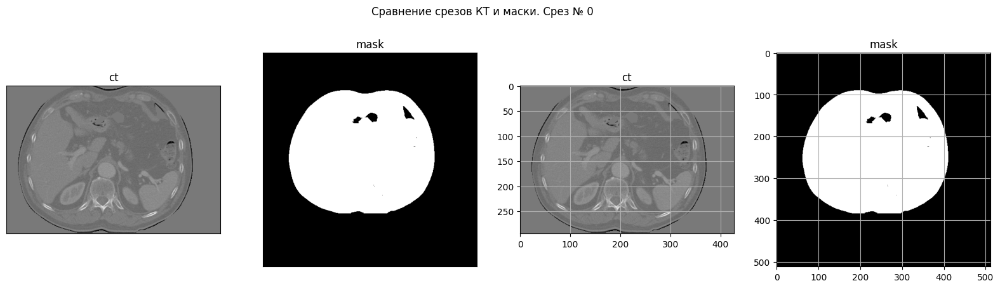

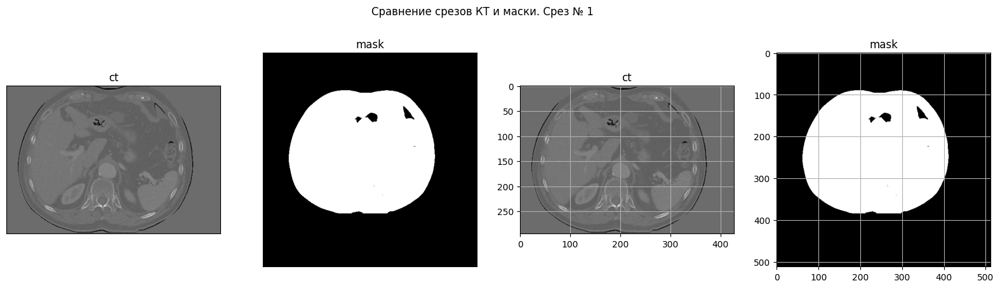

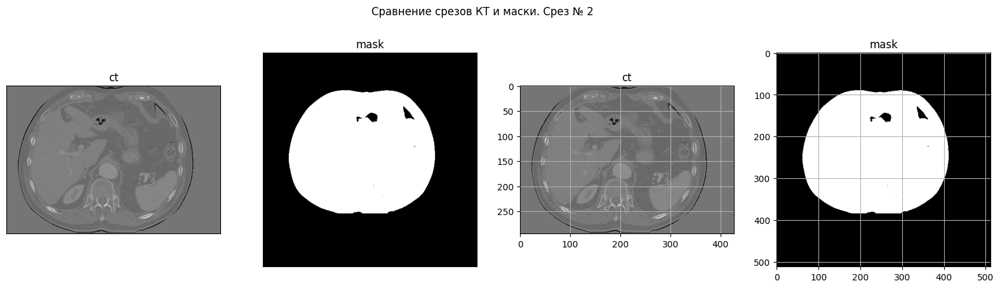

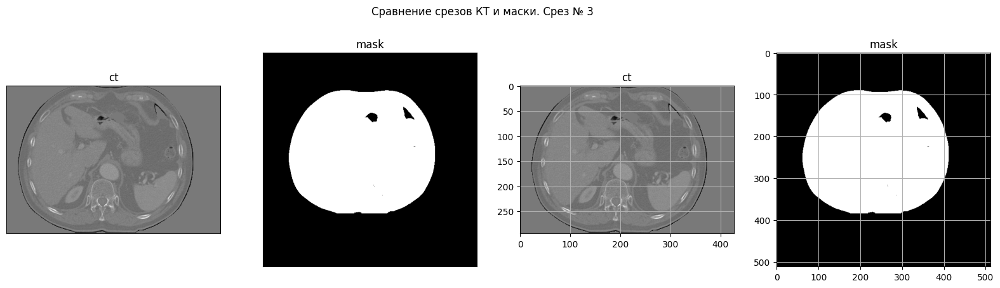

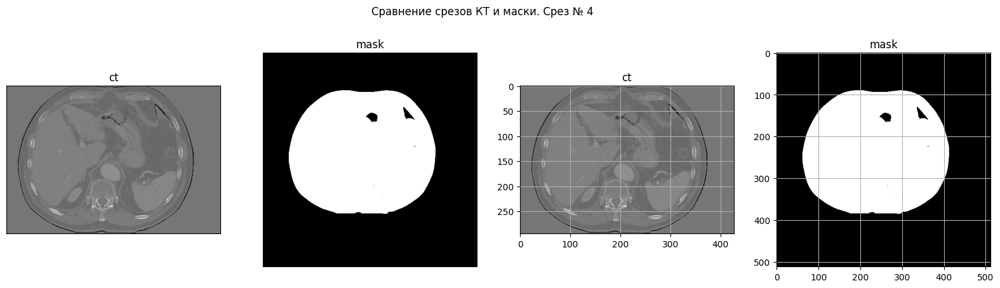

...

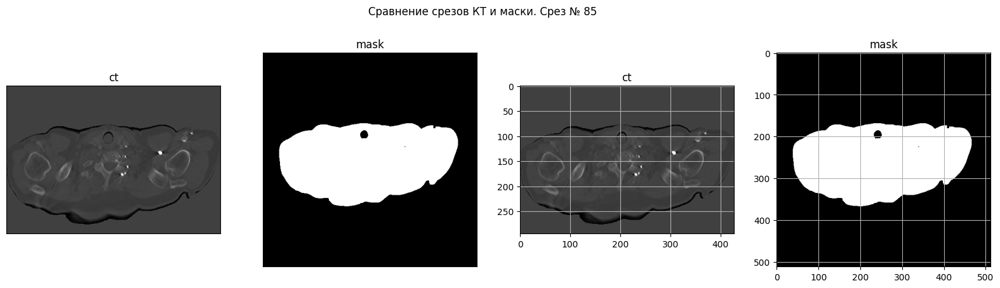

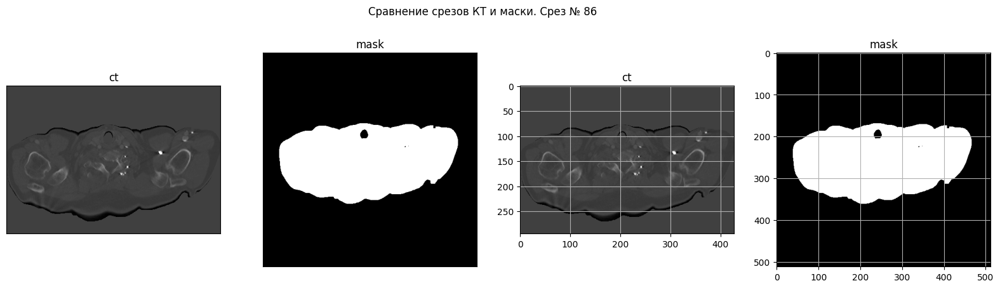

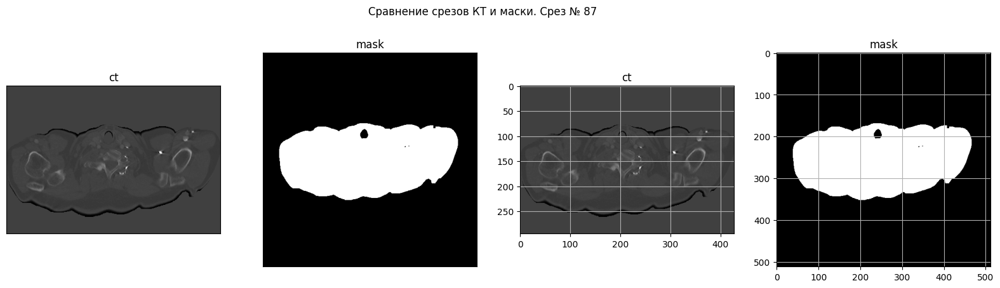

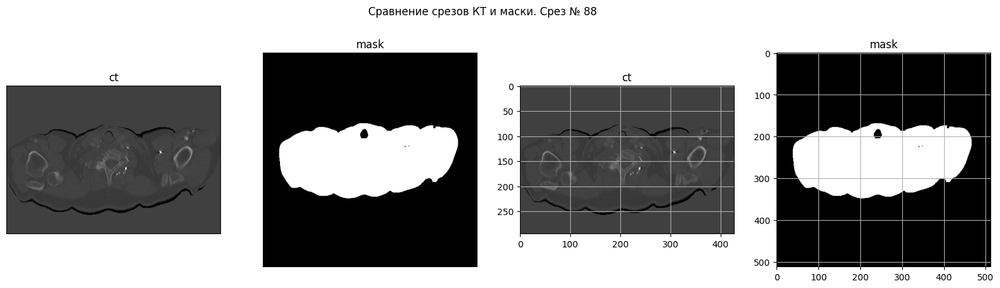

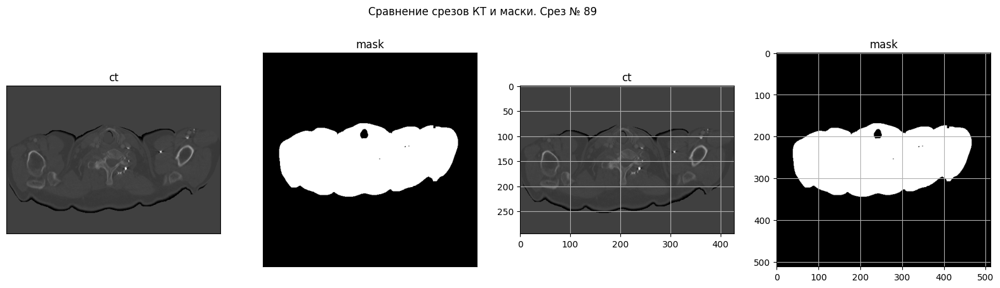

In [ ]:
# Имя бакета GCS и путь к папке для сохраненных файлов HDF5
bucket_name = 'pleural_effusion_dataset'
hdf5_folder_name = 'niftiToHDF5'

# Имя файла и номер пациента
file_name = 'LUNG1-005.h5'
patient_num = 'LUNG1-005'

# Загрузка файла HDF5 из GCS
bucket = storage_client.bucket(bucket_name)
blob = bucket.blob(os.path.join(hdf5_folder_name, file_name))
blob.download_to_filename(file_name)

# Открытие файла HDF5
with h5py.File(file_name, 'r') as hdf5_file:
    # Получение массива данных пациента
    nifti_array = hdf5_file[patient_num][()]
    nifti_array_otsu = threshold_otsu(nifti_array)
    binaryMaskOtsu = nifti_array > nifti_array_otsu # float
    eroded_mask = applyErosion(binaryMaskOtsu, 7)
    dilated_mask = applyDilation(eroded_mask, 9)

    # Обрезка изображения по маске
    masked_image = np.where(dilated_mask, nifti_array, 0)
    non_zero_indices = np.nonzero(dilated_mask)
    x, y, w, h = np.min(non_zero_indices[1]), np.min(non_zero_indices[0]), np.ptp(non_zero_indices[1]), np.ptp(non_zero_indices[0])
    cropped_image = masked_image[y:y+h, x:x+w]

    print(cropped_image.shape)
    for slice_index in range(90):
        fig, axs = outputSlices_ctMask(cropped_image, dilated_mask, slice_index, set_title_ct="ct", set_title_mask="mask")

In [ ]:
!curl https://sdk.cloud.google.com | bash
!gcloud init

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   443  100   443    0     0  18458      0 --:--:-- --:--:-- --:--:-- 18458
######################################################################## 100.0%
Running install script from: /tmp/tmp.qftAoBDPqK/install_google_cloud_sdk.bash
which curl
curl -# -f https://dl.google.com/dl/cloudsdk/channels/rapid/google-cloud-sdk.tar.gz
######################################################################## 100.0%

mkdir -p /root
"/root/google-cloud-sdk" already exists and may contain out of date files.
Remove /root/google-cloud-sdk or select a new installation directory, then run again.
Welcome! This command will take you through the configuration of gcloud.

Settings from your current configuration [default] are:
component_manager:
  disable_update_check: 'True'
core:
  account: ge293283@gmail.com

Pick configuration to use:
 [1] Re-

In [ ]:
# Имя бакета GCS и путь к папке для сохранения файлов HDF5
bucket_name = 'pleural_effusion_dataset'
hdf5_folder_name = 'niftiToHDF5'

# Получение списка подпапок в папке folderPath_originalCT
patient_folders = []
for entry in os.scandir(folderPath_originalCT):
    if entry.is_dir() and not entry.name.startswith('.'):
        patient_folders.append(entry.path)

# Цикл для обхода подпапок и создания файлов NIfTI и массивов NumPy
for folder in patient_folders:
    patient_num = os.path.basename(folder)  # Получение номера пациента из имени папки
    output_path = os.path.join(folderPath_output, f"{patient_num}.nii.gz")  # Путь для сохранения файла NIfTI
    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    # Конвертация DICOM в NIfTI
    dicom2nifti.dicom_series_to_nifti(folder, output_path)

    # Загрузка NIfTI файла с помощью nibabel
    nifti_image = nib.load(output_path)

    # Получение массива NumPy из NIfTI файла
    nifti_array = nifti_image.get_fdata()

    # Путь для сохранения файла HDF5
    hdf5_output_path = os.path.join(folderPath_output, f"{patient_num}.h5")

    # Сохранение массива NumPy в файл HDF5
    with h5py.File(hdf5_output_path, 'w') as hdf5_file:
        hdf5_file.create_dataset(patient_num, data=nifti_array)

    # Загрузка файла HDF5 в GCS
    gsutil_cp_cmd = f"gsutil cp {hdf5_output_path} gs://{bucket_name}/{hdf5_folder_name}/{patient_num}.h5"
    os.system(gsutil_cp_cmd)

    # Удаление локальной копии файла NIfTI и HDF5
    os.remove(output_path)
    os.remove(hdf5_output_path)

    print(f"Файл {patient_num} размерностью {nifti_array.shape} успешно сохранен в GCS.")


Файл LUNG1-005 размерностью (512, 512, 91) успешно сохранен в GCS.
Файл LUNG1-006 размерностью (512, 512, 114) успешно сохранен в GCS.
Файл LUNG1-007 размерностью (512, 512, 129) успешно сохранен в GCS.
Файл LUNG1-008 размерностью (512, 512, 114) успешно сохранен в GCS.
Файл LUNG1-009 размерностью (512, 512, 105) успешно сохранен в GCS.


In [ ]:
# Ручной отбор из 15-ти пациентов
s = 176
awn = ( s - 128 ) / 2
top = awn
bottom = s - awn
print(top, bottom)

24.0 152.0


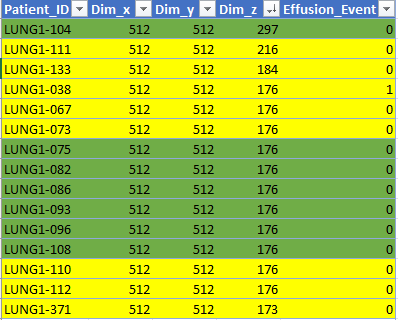

In [ ]:
# Функция приведения трехмерных массивов к единому размеру
def reducingArrayTo_commonShape(arrayToReshape, correctDimX=512, correctDimY=384, correctDimZ=128):

  """
  Функция приводит трехмерные массивы к единому размеру, заданному переменными correctDimX, correctDimY и correctDimZ.

  Аргументы:
  - arrayToReshape: трехмерный массив, который нужно привести к единому размеру.
  - correctDimX: желаемый размер по оси X (по умолчанию 512).
  - correctDimY: желаемый размер по оси Y (по умолчанию 384).
  - correctDimZ: желаемый размер по оси Z (по умолчанию 128).

  Возвращает:
  - correctArray: трехмерный массив с приведенным размером.

  Пример использования:
  correctArray = reducingArrayTo_commonShape(arrayToReshape)
  """

  correctArray = (correctDimX, correctDimY, correctDimZ)

  """
  Блок 0. Обработка по оси X

  """

  NumDimX = correctDimX - tensor_random.shape[0]
  if NumDimX > 0:
    if NumDimX / 2 % 1 == 0.5:
      topNumDimX = int(NumDimX / 2 - 0.5)
      downNumDimX = int(NumDimX / 2 + 0.5)
    elif NumDimX / 2 % 1 == 0.0:
      topNumDimX = int(NumDimX / 2)
      downNumDimX = int(NumDimX / 2)
    correctArray = np.pad(tensor_random, ((topNumDimX, downNumDimX), (0, 0), (0, 0)), mode='constant')
  elif NumDimX < 0:
    if NumDimX / 2 % 1 == 0.5:
      topNumDimX = int(NumDimX / 2 - 0.5) * -1
      downNumDimX = int(NumDimX / 2 + 0.5) * -1
    elif NumDimX / 2 % 1 == 0.0:
      topNumDimX = int(NumDimX / 2) * -1
      downNumDimX = int(NumDimX / 2) * -1
    if downNumDimX == 0:
      correctArray = tensor_random[topNumDimX:, :, :]
    else:
      correctArray = tensor_random[topNumDimX:-downNumDimX, :, :]
  else:
    correctArray = tensor_random

  """
  Блок 1. Обработка по оси Y

  """

  NumDimY = correctDimY - tensor_random.shape[1]
  if NumDimY > 0:
    if NumDimY / 2 % 1 == 0.5:
      topNumDimY = int(NumDimY / 2 - 0.5)
      downNumDimY = int(NumDimY / 2 + 0.5)
    elif NumDimY / 2 % 1 == 0.0:
      topNumDimY = int(NumDimY / 2)
      downNumDimY = int(NumDimY / 2)
    correctArray = np.pad(correctArray, ((0, 0), (topNumDimY, downNumDimY), (0, 0)), mode='constant')
  elif NumDimY < 0:
    if NumDimY / 2 % 1 == 0.5:
      topNumDimY = int(NumDimY / 2 - 0.5) * -1
      downNumDimY = int(NumDimY / 2 + 0.5) * -1
    elif NumDimY / 2 % 1 == 0.0:
      topNumDimY = int(NumDimY / 2) * -1
      downNumDimY = int(NumDimY / 2) * -1
    if downNumDimY == 0:
      correctArray = correctArray[:, topNumDimY:, :]
    else:
      correctArray = correctArray[:, topNumDimY:-downNumDimY, :]
  else:
    correctArray = tensor_random

  """
  Блок 2. Обработка по оси Z

  """

  NumDimZ = correctDimZ - tensor_random.shape[2]
  if NumDimZ > 0:
    if NumDimZ / 2 % 1 == 0.5:
      topNumDimZ = int(NumDimZ / 2 - 0.5)
      downNumDimZ = int(NumDimZ / 2 + 0.5)
    elif NumDimZ / 2 % 1 == 0.0:
      topNumDimZ = int(NumDimZ / 2)
      downNumDimZ = int(NumDimZ / 2)
    correctArray = np.pad(correctArray, ((0, 0), (0, 0), (topNumDimZ, downNumDimZ)), mode='constant')
  elif NumDimZ < 0:
    if NumDimZ / 2 % 1 == 0.5:
      topNumDimZ = int(NumDimZ / 2 - 0.5) * -1
      downNumDimZ = int(NumDimZ / 2 + 0.5) * -1
    elif NumDimZ / 2 % 1 == 0.0:
      topNumDimZ = int(NumDimZ / 2) * -1
      downNumDimZ = int(NumDimZ / 2) * -1
    if downNumDimZ == 0:
      correctArray = correctArray[:, :, topNumDimZ:]
    else:
      correctArray = correctArray[:, :, topNumDimZ:-downNumDimZ]
  else:
    correctArray = tensor_random

  return correctArray

In [ ]:
shape = (512, 411, 80)
tensor_random = np.random.randint(-1024, 3000, shape)
test = reducingArrayTo_commonShape(tensor_random)
print(tensor_random.shape)
print(test.shape)

(512, 411, 80)
(512, 384, 128)


In [ ]:
# correctDimX = 512
# correctDimY = 384
# correctDimZ = 128

# correctArray = (correctDimX, correctDimY, correctDimZ)

# """
# Блок 0. Обработка по оси X

# """

# NumDimX = correctDimX - tensor_random.shape[0]
# if NumDimX > 0:
#   if NumDimX / 2 % 1 == 0.5:
#     topNumDimX = int(NumDimX / 2 - 0.5)
#     downNumDimX = int(NumDimX / 2 + 0.5)
#   elif NumDimX / 2 % 1 == 0.0:
#     topNumDimX = int(NumDimX / 2)
#     downNumDimX = int(NumDimX / 2)
#   correctArray = np.pad(tensor_random, ((topNumDimX, downNumDimX), (0, 0), (0, 0)), mode='constant')
# elif NumDimX < 0:
#   if NumDimX / 2 % 1 == 0.5:
#     topNumDimX = int(NumDimX / 2 - 0.5) * -1
#     downNumDimX = int(NumDimX / 2 + 0.5) * -1
#     print(topNumDimX, downNumDimX)
#   elif NumDimX / 2 % 1 == 0.0:
#     topNumDimX = int(NumDimX / 2) * -1
#     downNumDimX = int(NumDimX / 2) * -1
#   if downNumDimX == 0:
#     correctArray = tensor_random[topNumDimX:, :, :]
#   else:
#     correctArray = tensor_random[topNumDimX:-downNumDimX, :, :]
# else:
#   correctArray = tensor_random

# # """
# # Блок 1. Обработка по оси Y

# # """

# # NumDimY = correctDimY - tensor_random.shape[1]
# # if NumDimY > 0:
# #   if NumDimY / 2 % 1 == 0.5:
# #     topNumDimY = int(NumDimY / 2 - 0.5)
# #     downNumDimY = int(NumDimY / 2 + 0.5)
# #   elif NumDimY / 2 % 1 == 0.0:
# #     topNumDimY = int(NumDimY / 2)
# #     downNumDimY = int(NumDimY / 2)
# #   correctArray = np.pad(correctArray, ((0, 0), (topNumDimY, downNumDimY), (0, 0)), mode='constant')
# # elif NumDimY < 0:
# #   if NumDimY / 2 % 1 == 0.5:
# #     topNumDimY = int(NumDimY / 2 - 0.5) * -1
# #     downNumDimY = int(NumDimY / 2 + 0.5) * -1
# #   elif NumDimY / 2 % 1 == 0.0:
# #     topNumDimY = int(NumDimY / 2) * -1
# #     downNumDimY = int(NumDimY / 2) * -1
# #   correctArray = correctArray[:, topNumDimY:-downNumDimY, :]
# # else:
# #   correctArray = correctArray

# # """
# # Блок 2. Обработка по оси Z

# # """

# # NumDimZ = correctDimZ - tensor_random.shape[2]
# # if NumDimZ > 0:
# #   if NumDimZ / 2 % 1 == 0.5:
# #     topNumDimZ = int(NumDimZ / 2 - 0.5)
# #     downNumDimZ = int(NumDimZ / 2 + 0.5)
# #   elif NumDimZ / 2 % 1 == 0.0:
# #     topNumDimZ = int(NumDimZ / 2)
# #     downNumDimZ = int(NumDimZ / 2)
# #   correctArray = np.pad(correctArray, ((0, 0), (0, 0), (topNumDimZ, downNumDimZ)), mode='constant')
# # elif NumDimZ < 0:
# #   if NumDimZ / 2 % 1 == 0.5:
# #     topNumDimZ = int(NumDimZ / 2 - 0.5) * -1
# #     downNumDimZ = int(NumDimZ / 2 + 0.5) * -1
# #   elif NumDimZ / 2 % 1 == 0.0:
# #     topNumDimZ = int(NumDimZ / 2) * -1
# #     downNumDimZ = int(NumDimZ / 2) * -1
# #   correctArray = correctArray[:, :, topNumDimZ:-downNumDimZ]
# # else:
# #   correctArray = correctArray

# # print(correctArray.shape)

(512, 384, 128)


In [ ]:
# одна из версий, работает не корректно
# import scipy.ndimage as ndimage

# # Создание локальной папки для файлов HDF5
# os.makedirs(folderPathColab_tmp, exist_ok=True)

# bucket = storage_client.bucket(bucketName)
# blobs_ct = bucket.list_blobs(prefix=folderGCS_hdf5 + '/')
# blobs_mask = bucket.list_blobs(prefix=folderGCS_hdf5_effusions)

# patient_numMaskList = []

# # Получаю список масок
# # Проход по каждому файлу масок HDF5
# for blob in blobs_mask:
#   # Получение имени файла
#   file_name = os.path.basename(blob.name)
#   if file_name.endswith('_mask.h5'):
#       patient_num = file_name.split('_')[0]
#       patient_numMaskList.append(patient_num)
#   else:
#       continue
# # print(patient_numMaskList)

# # Проход по каждому файлу CT HDF5
# # Работаем с файлами CT в формате *.h5
# for blob in blobs_ct:
#     # Получение имени файла
#     file_name = os.path.basename(blob.name)
#     if file_name.endswith('.h5'):
#         patient_num = os.path.splitext(file_name)[0]
#         # Скачивание файла CT HDF5 из GCS во временную папку
#         temp_file_path_ct = os.path.join(folderPathColab_tmp, file_name)
#         try:
#             blob.download_to_filename(temp_file_path_ct)
#             print(f"Файл CT успешно скачан: {file_name}")
#         except Exception as e:
#             print(f"Ошибка при скачивании файла CT {file_name}: {str(e)}")
#             continue
#         # Проверяем, существует ли соответствующий файл с маской
#         mask_file_name = patient_num + '_mask.h5'
#         mask_file_exists = patient_num in patient_numMaskList
#         if mask_file_exists:
#             # Скачивание файла маски HDF5 из GCS во временную папку
#             temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
#             try:
#                 mask_blob = bucket.blob(folderGCS_hdf5_effusions + '/' + mask_file_name)
#                 mask_blob.download_to_filename(temp_file_path_mask)
#                 print(f"Файл маски успешно скачан: {mask_file_name}")
#                 with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
#                     tensor_shape = hdf5_file[patient_num].shape
#             except Exception as e:
#                 print(f"Ошибка при скачивании файла маски {mask_file_name}: {str(e)}")
#                 continue
#         else:
#             # Создание файла маски HDF5 с добавлением _mask
#             temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
#             try:
#                 createArrayMask = np.zeros((tensor_shape), dtype=np.float64)
#                 with h5py.File(temp_file_path_mask, 'w') as hdf5_file:
#                     hdf5_file.create_dataset('mask', data=createArrayMask)

#                 print(f"Создан новый файл маски: {mask_file_name}")
#             except Exception as e:
#                 print(f"Ошибка при создании нового файла маски {mask_file_name}: {str(e)}")
#                 continue

#         # with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
#         #     nifti_array_ct = hdf5_file[patient_num][()]

#         # with h5py.File(temp_file_path_mask, 'r') as hdf5_file:
#         #     nifti_array_mask = hdf5_file['mask'][()]

#         # # Обрезка по Z
#         # nifti_array_ct = reducingArrayTo_commonShapeZ(nifti_array_ct)
#         # nifti_array_mask = reducingArrayTo_commonShapeZ(nifti_array_mask)
#         # print(nifti_array_ct.shape, nifti_array_mask.shape)

#         # # Создание маски
#         # nifti_array_otsu = threshold_otsu(nifti_array_ct)
#         # binaryMaskOtsu = nifti_array_ct > nifti_array_otsu
#         # eroded_mask = applyErosion(binaryMaskOtsu, 7)
#         # dilated_mask = applyDilation(eroded_mask, 9)
#         # dilated_mask = dilated_mask.astype(int)
#         # print("dilated_mask")
#         # print(dilated_mask)

#         # Обрезка изображения по маске
#         # Для тензора CT
#         # cropped_image_ct = crop_tensor_by_mask(nifti_array_ct, dilated_mask)

#         # # Для тензора маски
#         # cropped_image_mask = crop_tensor_by_mask(nifti_array_mask, dilated_mask)

#         # print(cropped_image_ct.shape, cropped_image_mask.shape)
#         # print()
#         #         # Вывод 16 рядов по 8 срезов
#         # num_rows = 16
#         # num_cols = 8

#         # # Создание полотна с графиками для CT срезов
#         # fig_ct, axs_ct = plt.subplots(num_rows, num_cols, figsize=(20, 40))

#         # # Итерация по строкам и столбцам для отображения CT срезов
#         # for i in range(num_rows):
#         #     for j in range(num_cols):
#         #         # Определение индекса CT среза для отображения
#         #         index = i * num_cols + j

#         #         if index >= cropped_image_ct.shape[2]:
#         #             break

#         #         # Получение CT среза для отображения
#         #         slice_data_ct = cropped_image_ct[:, :, index]

#         #         # Отображение CT среза
#         #         axs_ct[i, j].imshow(np.rot90(slice_data_ct), cmap='gray')
#         #         axs_ct[i, j].set_xticks([])
#         #         axs_ct[i, j].set_yticks([])

#         #         # Установка заголовка для каждого CT среза с его индексом
#         #         axs_ct[i, j].set_title(f"CT Slice {index}")

#         # plt.tight_layout()
#         # plt.show()

#         # # Создание полотна с графиками для срезов маски
#         # fig_mask, axs_mask = plt.subplots(num_rows, num_cols, figsize=(20, 40))

#         # # Итерация по строкам и столбцам для отображения срезов маски
#         # for i in range(num_rows):
#         #     for j in range(num_cols):
#         #         # Определение индекса среза маски для отображения
#         #         index = i * num_cols + j

#         #         if index >= cropped_image_mask.shape[2]:
#         #             break

#         #         # Получение среза маски для отображения
#         #         slice_data_mask = cropped_image_mask[:, :, index]

#         #         # Отображение среза маски
#         #         axs_mask[i, j].imshow(np.rot90(slice_data_mask), cmap='gray')
#         #         axs_mask[i, j].set_xticks([])
#         #         axs_mask[i, j].set_yticks([])

#         #         # Установка заголовка для каждого среза маски с его индексом
#         #         axs_mask[i, j].set_title(f"Mask Slice {index}")

#         # plt.tight_layout()
#         # plt.show()

#         # # Создание полотна с графиками для срезов dilated mask
#         # fig_dilated_mask, axs_dilated_mask = plt.subplots(num_rows, num_cols, figsize=(20, 40))

#         # # Итерация по строкам и столбцам для отображения срезов dilated mask
#         # for i in range(num_rows):
#         #     for j in range(num_cols):
#         #         # Определение индекса среза dilated mask для отображения
#         #         index = i * num_cols + j

#         #         if index >= dilated_mask.shape[2]:
#         #             break

#         #         # Получение среза dilated mask для отображения
#         #         slice_data_dilated_mask = dilated_mask[:, :, index]

#         #         # Отображение среза dilated mask
#         #         axs_dilated_mask[i, j].imshow(np.rot90(slice_data_dilated_mask), cmap='gray')
#         #         axs_dilated_mask[i, j].set_xticks([])
#         #         axs_dilated_mask[i, j].set_yticks([])

#         #         # Установка заголовка для каждого среза dilated mask с его индексом
#         #         axs_dilated_mask[i, j].set_title(f"Dilated Mask Slice {index}")

#         # plt.tight_layout()
#         # plt.show()

#         # Удаление локальной копии файла NIfTI и HDF5
#         # os.remove(temp_file_path_ct)
#         # os.remove(temp_file_path_mask)
#         # del temp_file_path_ct
#         # del temp_file_path_mask
#         # del nifti_array_ct
#         # del nifti_array_mask
#         # del nifti_array_otsu
#         # del binaryMaskOtsu
#         # del eroded_mask
#         # del dilated_mask
#         # del cropped_image_ct
#         # del cropped_image_mask


#     else:
#         continue

In [ ]:
# Создание локальной папки для файлов HDF5
os.makedirs(folderPathColab_tmp, exist_ok=True)

bucket = storage_client.bucket(bucketName)
blobs_ct = bucket.list_blobs(prefix=folderGCS_hdf5 + '/')
blobs_mask = bucket.list_blobs(prefix=folderGCS_hdf5_effusions)

patient_numMaskList = []
Create_patient_numMaskList = []

# Проход по каждому файлу масок HDF5
for blob in blobs_mask:
  # Получение имени файла
  file_name = os.path.basename(blob.name)
  if file_name.endswith('_mask.h5'):
      patient_num = file_name.split('_')[0]
      patient_numMaskList.append(patient_num)
  else:
      continue
# print(patient_numMaskList)
# Проход по каждому файлу CT HDF5
for blob in blobs_ct:
    # Получение имени файла
    file_name = os.path.basename(blob.name)
    if file_name.endswith('.h5'):
        patient_num = os.path.splitext(file_name)[0]

        # Скачивание файла CT HDF5 из GCS во временную папку
        temp_file_path_ct = os.path.join(folderPathColab_tmp, file_name)
        try:
            blob.download_to_filename(temp_file_path_ct)
            print(f"Файл CT успешно скачан: {file_name}")
        except Exception as e:
            print(f"Ошибка при скачивании файла CT {file_name}: {str(e)}")
            continue

        # Проверяем, существует ли соответствующий файл с маской
        mask_file_name = patient_num + '_mask.h5'
        mask_file_exists = patient_num in patient_numMaskList

        if mask_file_exists:
            # Скачивание файла маски HDF5 из GCS во временную папку
            temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
            try:
                mask_blob = bucket.blob(folderGCS_hdf5_effusions + '/' + mask_file_name)
                mask_blob.download_to_filename(temp_file_path_mask)
                print(f"Файл маски успешно скачан: {mask_file_name}")
                with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
                  tensor_shape = hdf5_file[patient_num].shape
            except Exception as e:
                print(f"Ошибка при скачивании файла маски {mask_file_name}: {str(e)}")
                continue
        else:
            # Создание файла маски HDF5 с добавлением _mask
            temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
            try:
                createArrayMask = np.zeros((tensor_shape), dtype=np.float64)
                with h5py.File(temp_file_path_mask, 'w') as hdf5_file:
                    hdf5_file.create_dataset('mask', data=createArrayMask)

                print(f"Создан новый файл маски: {mask_file_name}")
            except Exception as e:
                print(f"Ошибка при создании нового файла маски {mask_file_name}: {str(e)}")
                continue


        with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
          nifti_array_ct = hdf5_file[patient_num][()]

        with h5py.File(temp_file_path_mask, 'r') as hdf5_file:
          nifti_array_mask = hdf5_file['mask'][()]

        # Обрезка по Z
        nifti_array_ct = reducingArrayTo_commonShapeZ(nifti_array_ct)
        nifti_array_mask = reducingArrayTo_commonShapeZ(nifti_array_mask)
        print(nifti_array_ct.shape, nifti_array_mask.shape)

        # Создание маски
        nifti_array_otsu = threshold_otsu(nifti_array_ct)
        binaryMaskOtsu = nifti_array_ct > nifti_array_otsu
        eroded_mask = applyErosion(binaryMaskOtsu, 7)
        dilated_mask = applyDilation(eroded_mask, 9)


        # Обрезка изображения по маске
        non_zero_indices = np.argwhere(dilated_mask)
        y, x, z = non_zero_indices.min(axis=0)
        h, w, d = non_zero_indices.ptp(axis=0) + 1

        cropped_image_ct = nifti_array_ct[y:y+h, x:x+w, z:z+d]
        cropped_image_mask = nifti_array_mask[y:y+h, x:x+w, z:z+d]
        print(cropped_image_ct.shape, cropped_image_mask.shape, dilated_mask.shape)



        # Создание полотна с графиком для CT срезов
        fig_ct, axs_ct = plt.subplots(1, 8, figsize=(20, 5))

        # Начальный индекс среза для отображения
        start_index = 60

        # Итерация по столбцам для отображения CT срезов
        for j in range(8):
            # Определение индекса CT среза для отображения
            index = start_index + j

            # Получение CT среза для отображения
            slice_data_ct = cropped_image_ct[:, :, index]

            # Отображение CT среза
            axs_ct[j].imshow(np.rot90(slice_data_ct), cmap='gray')
            axs_ct[j].set_xticks([])
            axs_ct[j].set_yticks([])

            # Установка заголовка для каждого CT среза с его индексом
            axs_ct[j].set_title(f"CT Slice {index}")

        plt.tight_layout()
        plt.show()

        # Создание полотна с графиком для срезов маски
        fig_mask, axs_mask = plt.subplots(1, 8, figsize=(20, 5))

        # Итерация по столбцам для отображения срезов маски
        for j in range(8):
            # Определение индекса среза маски для отображения
            index = start_index + j

            # Получение среза маски для отображения
            slice_data_mask = dilated_mask[:, :, index]

            # Отображение среза маски
            axs_mask[j].imshow(np.rot90(slice_data_mask), cmap='gray')
            axs_mask[j].set_xticks([])
            axs_mask[j].set_yticks([])

            # Установка заголовка для каждого среза маски с его индексом
            axs_mask[j].set_title(f"Mask Slice {index}")

        plt.tight_layout()
        plt.show()


        # Создание полотна с графиком для срезов маски
        fig_mask, axs_mask = plt.subplots(1, 8, figsize=(20, 5))

        # Итерация по столбцам для отображения срезов маски
        for j in range(8):
            # Определение индекса среза маски для отображения
            index = start_index + j

            # Получение среза маски для отображения
            slice_data_mask = cropped_image_mask[:, :, index]

            # Отображение среза маски
            axs_mask[j].imshow(np.rot90(slice_data_mask), cmap='gray')
            axs_mask[j].set_xticks([])
            axs_mask[j].set_yticks([])

            # Установка заголовка для каждого среза маски с его индексом
            axs_mask[j].set_title(f"Mask Slice {index}")

        plt.tight_layout()
        plt.show()

    else:
        continue







    #     # Сохранение обрезанного изображения в виде тензора H5
    #     output_cropped_name = f"{patient_num}_cropped.h5"
    #     output_cropped_path = os.path.join(folderPathColab_tmp, output_cropped_name)
    #     with h5py.File(output_cropped_path, 'w') as output_cropped_file:
    #         output_cropped_file.create_dataset('cropped_image', data=cropped_image)

    #     # Загрузка обрезанного тензора H5 в GCS
    #     bucket = storage_client.bucket(bucketName)
    #     blob = bucket.blob(os.path.join(folderGCS_hdf5_cropped, f"{patient_num}_cropped.h5"))
    #     blob.upload_from_filename(output_cropped_path)

    # # Удаление локальных файлов HDF5
    # os.remove(temp_file_path)
    # os.remove(output_mask_path)
    # os.remove(output_cropped_path)

    # # Вывод сообщения после успешной загрузки файлов в GCS
    # print(f"Файлы {output_cropped_name} ({cropped_image.shape}), {output_mask_name}, успешно загружены в GCS.")

In [ ]:
# Создание локальной папки для файлов HDF5
os.makedirs(folderPathColab_tmp, exist_ok=True)

bucket = storage_client.bucket(bucketName)
blobs_ct = bucket.list_blobs(prefix=folderGCS_hdf5 + '/')
blobs_mask = bucket.list_blobs(prefix=folderGCS_hdf5_effusions)

patient_numMaskList = []

# Получаю список масок
# Проход по каждому файлу масок HDF5
for blob in blobs_mask:
  # Получение имени файла
  file_name = os.path.basename(blob.name)
  if file_name.endswith('_mask.h5'):
      patient_num = file_name.split('_')[0]
      patient_numMaskList.append(patient_num)
  else:
      continue
# print(patient_numMaskList)

# Проход по каждому файлу CT HDF5
# Работаем с файлами CT в формате *.h5
for blob in blobs_ct:
    # Получение имени файла
    file_name = os.path.basename(blob.name)
    if file_name.endswith('.h5'):
        patient_num = os.path.splitext(file_name)[0]
        # Скачивание файла CT HDF5 из GCS во временную папку
        temp_file_path_ct = os.path.join(folderPathColab_tmp, file_name)
        try:
            blob.download_to_filename(temp_file_path_ct)
            print(f"Файл CT успешно скачан: {file_name}")
        except Exception as e:
            print(f"Ошибка при скачивании файла CT {file_name}: {str(e)}")
            continue
        # Проверяем, существует ли соответствующий файл с маской
        mask_file_name = patient_num + '_mask.h5'
        mask_file_exists = patient_num in patient_numMaskList
        if mask_file_exists:
            # Скачивание файла маски HDF5 из GCS во временную папку
            temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
            try:
                mask_blob = bucket.blob(folderGCS_hdf5_effusions + '/' + mask_file_name)
                mask_blob.download_to_filename(temp_file_path_mask)
                print(f"Файл маски успешно скачан: {mask_file_name}")
                with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
                    tensor_shape = hdf5_file[patient_num].shape
            except Exception as e:
                print(f"Ошибка при скачивании файла маски {mask_file_name}: {str(e)}")
                continue
        else:
            # Создание файла маски HDF5 с добавлением _mask
            temp_file_path_mask = os.path.join(folderPathColab_tmp, mask_file_name)
            try:
                createArrayMask = np.zeros((tensor_shape), dtype=np.float64)
                with h5py.File(temp_file_path_mask, 'w') as hdf5_file:
                    hdf5_file.create_dataset('mask', data=createArrayMask)

                print(f"Создан новый файл маски: {mask_file_name}")
            except Exception as e:
                print(f"Ошибка при создании нового файла маски {mask_file_name}: {str(e)}")
                continue

        with h5py.File(temp_file_path_ct, 'r') as hdf5_file:
            nifti_array_ct = hdf5_file[patient_num][()]

        with h5py.File(temp_file_path_mask, 'r') as hdf5_file:
            nifti_array_mask = hdf5_file['mask'][()]

        # Обрезка по Z
        nifti_array_ct = reducingArrayTo_commonShapeZ(nifti_array_ct)
        nifti_array_mask = reducingArrayTo_commonShapeZ(nifti_array_mask)
        print(nifti_array_ct.shape, nifti_array_mask.shape)

        # Создание маски
        nifti_array_otsu = threshold_otsu(nifti_array_ct)
        binaryMaskOtsu = nifti_array_ct > nifti_array_otsu
        eroded_mask = applyErosion(binaryMaskOtsu, 7)
        dilated_mask = applyDilation(eroded_mask, 9)
        dilated_mask = dilated_mask.astype(int)
        # print("dilated_mask")
        # print(dilated_mask)

        # Обрезка изображения по маске
        non_zero_indices = np.argwhere(dilated_mask)
        # print("non_zero_indices")
        # print(non_zero_indices)
        y, x, z = non_zero_indices.min(axis=0)
        h, w, d = non_zero_indices.ptp(axis=0) + 1

        cropped_image_ct = nifti_array_ct[y:y+h, x:x+w, z:z+d]
        cropped_image_mask = nifti_array_mask[y:y+h, x:x+w, z:z+d]
        print(cropped_image_ct.shape, cropped_image_mask.shape, y, x, z, h, w, d, dilated_mask.shape)
        print()
                # Вывод 16 рядов по 8 срезов
        num_rows = 16
        num_cols = 8

        # Создание полотна с графиками для CT срезов
        fig_ct, axs_ct = plt.subplots(num_rows, num_cols, figsize=(20, 40))

        # Итерация по строкам и столбцам для отображения CT срезов
        for i in range(num_rows):
            for j in range(num_cols):
                # Определение индекса CT среза для отображения
                index = i * num_cols + j

                if index >= cropped_image_ct.shape[2]:
                    break

                # Получение CT среза для отображения
                slice_data_ct = cropped_image_ct[:, :, index]

                # Отображение CT среза
                axs_ct[i, j].imshow(np.rot90(slice_data_ct), cmap='gray')
                axs_ct[i, j].set_xticks([])
                axs_ct[i, j].set_yticks([])

                # Установка заголовка для каждого CT среза с его индексом
                axs_ct[i, j].set_title(f"CT Slice {index}")

        plt.tight_layout()
        plt.show()

        # Создание полотна с графиками для срезов маски
        fig_mask, axs_mask = plt.subplots(num_rows, num_cols, figsize=(20, 40))

        # Итерация по строкам и столбцам для отображения срезов маски
        for i in range(num_rows):
            for j in range(num_cols):
                # Определение индекса среза маски для отображения
                index = i * num_cols + j

                if index >= cropped_image_mask.shape[2]:
                    break

                # Получение среза маски для отображения
                slice_data_mask = cropped_image_mask[:, :, index]

                # Отображение среза маски
                axs_mask[i, j].imshow(np.rot90(slice_data_mask), cmap='gray')
                axs_mask[i, j].set_xticks([])
                axs_mask[i, j].set_yticks([])

                # Установка заголовка для каждого среза маски с его индексом
                axs_mask[i, j].set_title(f"Mask Slice {index}")

        plt.tight_layout()
        plt.show()

        # Создание полотна с графиками для срезов dilated mask
        fig_dilated_mask, axs_dilated_mask = plt.subplots(num_rows, num_cols, figsize=(20, 40))

        # Итерация по строкам и столбцам для отображения срезов dilated mask
        for i in range(num_rows):
            for j in range(num_cols):
                # Определение индекса среза dilated mask для отображения
                index = i * num_cols + j

                if index >= dilated_mask.shape[2]:
                    break

                # Получение среза dilated mask для отображения
                slice_data_dilated_mask = dilated_mask[:, :, index]

                # Отображение среза dilated mask
                axs_dilated_mask[i, j].imshow(np.rot90(slice_data_dilated_mask), cmap='gray')
                axs_dilated_mask[i, j].set_xticks([])
                axs_dilated_mask[i, j].set_yticks([])

                # Установка заголовка для каждого среза dilated mask с его индексом
                axs_dilated_mask[i, j].set_title(f"Dilated Mask Slice {index}")

        plt.tight_layout()
        plt.show()

        # Удаление локальной копии файла NIfTI и HDF5
        os.remove(temp_file_path_ct)
        os.remove(temp_file_path_mask)

    else:
        continue

In [ ]:
with h5py.File("/content/sample_data/tmp/LUNG1-002.h5", 'r') as hdf5_file:
    nifti_array_ct = hdf5_file['LUNG1-002'][()]

with h5py.File("/content/sample_data/tmp/LUNG1-002_mask.h5", 'r') as hdf5_file:
    nifti_array_mask = hdf5_file['mask'][()]

# Вырвниване по Z
fnifti_array_ct = reducingArrayTo_commonShapeZ(nifti_array_ct)
fnifti_array_mask = reducingArrayTo_commonShapeZ(nifti_array_mask)

# Создание маски
nifti_array_otsu = threshold_otsu(fnifti_array_ct)
binaryMaskOtsu = fnifti_array_ct > nifti_array_otsu
eroded_mask = applyErosion(binaryMaskOtsu, 7)
dilated_mask = applyDilation(eroded_mask, 9)

# Получения координат тела и обрезка по X и Y
non_zero_indices = np.argwhere(dilated_mask)
y, x, _ = non_zero_indices.min(axis=0)  # Игнорируем координату z
h, w, _ = non_zero_indices.ptp(axis=0) + 1  # Игнорируем координату z
cropped_image_ct = fnifti_array_ct[y:y+h, x:x+w, :]
cropped_image_mask = fnifti_array_mask[y:y+h, x:x+w, :]

# Вырвниване по X и Y
array_reshape_ct = reducingArrayTo_commonShape2(cropped_image_ct)
array_reshape_mask = reducingArrayTo_commonShape2(cropped_image_mask)

# Нормализация значение в пределах 0-1
array_normalize = normalizeVolume(array_reshape_ct)


print(nifti_array_ct.shape, nifti_array_mask.shape)
print(fnifti_array_ct.shape, fnifti_array_mask.shape)
print(cropped_image_ct.shape, cropped_image_mask.shape)
print(array_reshape_ct.shape, array_reshape_mask.shape)
print()

# Вывод срезов
num_rows = 16
num_cols = 8


fig_ct, axs_ct = plt.subplots(num_rows, num_cols, figsize=(20, 40))

# Итерация по строкам и столбцам для отображения CT срезов
for i in range(num_rows):
    for j in range(num_cols):
        # Определение индекса CT среза для отображения
        index = i * num_cols + j

        if index >= array_reshape_ct.shape[2]:
            break
        # Получение CT среза для отображения
        slice_data_ct = array_reshape_ct[:, :, index]
        # Отображение CT среза
        axs_ct[i, j].imshow(np.rot90(slice_data_ct), cmap='gray')
        axs_ct[i, j].set_xticks([])
        axs_ct[i, j].set_yticks([])
plt.tight_layout()
plt.show()

In [ ]:
def reducingArrayTo_commonShapeZ(arrayToReshape, correctDimX=512, correctDimY=384, correctDimZ=128):
    # Вычисляем разницу по оси Z
    NumDimZ = correctDimZ - arrayToReshape.shape[2]

    if NumDimZ > 0:
        # Добавляем слои со значениями -1024 с обеих сторон
        topNumDimZ = NumDimZ // 2
        downNumDimZ = NumDimZ - topNumDimZ
        arrayToReshape = np.pad(arrayToReshape, ((0, 0), (0, 0), (topNumDimZ, downNumDimZ)), mode='constant', constant_values=-1024)
    elif NumDimZ < 0:
        # Обрезаем лишние слои
        topNumDimZ = -NumDimZ // 2
        downNumDimZ = -NumDimZ - topNumDimZ
        if downNumDimZ == 0:
            arrayToReshape = arrayToReshape[:, :, topNumDimZ:]
        else:
            arrayToReshape = arrayToReshape[:, :, topNumDimZ:-downNumDimZ]

    return arrayToReshape

In [ ]:
def reducingArrayTo_commonShape2(arrayToReshape, correctDimX=512, correctDimY=384, correctDimZ=128):
    # Вычисляем разницу по оси X
    NumDimX = correctDimX - arrayToReshape.shape[0]

    if NumDimX > 0:
        # Добавляем слои со значениями -1024 с обеих сторон
        topNumDimX = NumDimX // 2
        downNumDimX = NumDimX - topNumDimX
        arrayToReshape = np.pad(arrayToReshape, ((topNumDimX, downNumDimX), (0, 0), (0, 0)), mode='constant', constant_values=-1024)
    elif NumDimX < 0:
        # Обрезаем лишние слои
        topNumDimX = -NumDimX // 2
        downNumDimX = -NumDimX - topNumDimX
        if downNumDimX == 0:
            arrayToReshape = arrayToReshape[topNumDimX:, :, :]
        else:
            arrayToReshape = arrayToReshape[topNumDimX:-downNumDimX, :, :]

    # Вычисляем разницу по оси Y
    NumDimY = correctDimY - arrayToReshape.shape[1]

    if NumDimY > 0:
        # Добавляем слои со значениями -1024 с обеих сторон
        topNumDimY = NumDimY // 2
        downNumDimY = NumDimY - topNumDimY
        arrayToReshape = np.pad(arrayToReshape, ((0, 0), (topNumDimY, downNumDimY), (0, 0)), mode='constant', constant_values=-1024)
    elif NumDimY < 0:
        # Обрезаем лишние слои
        topNumDimY = -NumDimY // 2
        downNumDimY = -NumDimY - topNumDimY
        if downNumDimY == 0:
            arrayToReshape = arrayToReshape[:, topNumDimY:, :]
        else:
            arrayToReshape = arrayToReshape[:, topNumDimY:-downNumDimY, :]

    return arrayToReshape

## Конструктор

In [ ]:
import tensorflow as tf

    """
    Загрузка файла HDF5 с тензором или маской.

    Аргументы:
    - file_path: Путь к файлу HDF5

    Возвращает:
    - Загруженный тензор или маску в виде NumPy массива
    """
    with h5py.File(file_path, 'r') as hdf5_file:
        data = hdf5_file['xx'][()]
    return data


class DataGenerator(tf.keras.utils.Sequence):
    """
    Генератор данных для подачи в модель.

    Аргументы:
    - tensor_folder: Путь к папке с тензорами на GCS
    - mask_folder: Путь к папке с масками на GCS
    - batch_size: Размер пакета данных
    """

    # def __init__(self, tensor_folder, mask_folder, batch_size):
    #     self.tensor_folder = tensor_folder
    #     self.mask_folder = mask_folder
    #     self.batch_size = batch_size
    #     self.tensor_files = self.get_file_list(tensor_folder)
    #     self.mask_files = self.get_file_list(mask_folder)

    def get_file_list(self, folder):
        """
        Получение списка файлов в папке.

        Аргументы:
        - folder: Путь к папке

        Возвращает:
        - Список файлов в папке
        """

    def __len__(self):
        """
        Получение общего количества пакетов данных.

        Возвращает:
        - Общее количество пакетов данных
        """
        # return len

    def __getitem__(self, index):
        """
        Получение пакета данных по индексу.

        Аргументы:
        - index: Индекс пакета данных

        Возвращает:
        - Пакет данных, состоящий из тензоров и масок
        """

tensor_folder =
mask_folder =
batch_size =

data_generator = DataGenerator(tensor_folder, mask_folder, batch_size)

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, UpSampling3D, concatenate

# def unet_3d(input_shape):
#     inputs = Input(input_shape)

#     # Encoder
#     conv1 = Conv3D(64, 3, activation='relu', padding='same')(inputs)
#     conv1 = Conv3D(64, 3, activation='relu', padding='same')(conv1)
#     pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)

#     conv2 = Conv3D(128, 3, activation='relu', padding='same')(pool1)
#     conv2 = Conv3D(128, 3, activation='relu', padding='same')(conv2)
#     pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

#     conv3 = Conv3D(256, 3, activation='relu', padding='same')(pool2)
#     conv3 = Conv3D(256, 3, activation='relu', padding='same')(conv3)
#     pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)

#     # Bottom
#     conv4 = Conv3D(512, 3, activation='relu', padding='same')(pool3)
#     conv4 = Conv3D(512, 3, activation='relu', padding='same')(conv4)

#     # Decoder
#     up1 = UpSampling3D(size=(2, 2, 2))(conv4)
#     up1 = Conv3D(256, 2, activation='relu', padding='same')(up1)
#     merge1 = concatenate([conv3, up1], axis=-1)
#     conv5 = Conv3D(256, 3, activation='relu', padding='same')(merge1)
#     conv5 = Conv3D(256, 3, activation='relu', padding='same')(conv5)

#     up2 = UpSampling3D(size=(2, 2, 2))(conv5)
#     up2 = Conv3D(128, 2, activation='relu', padding='same')(up2)
#     merge2 = concatenate([conv2, up2], axis=-1)
#     conv6 = Conv3D(128, 3, activation='relu', padding='same')(merge2)
#     conv6 = Conv3D(128, 3, activation='relu', padding='same')(conv6)

#     up3 = UpSampling3D(size=(2, 2, 2))(conv6)
#     up3 = Conv3D(64, 2, activation='relu', padding='same')(up3)
#     merge3 = concatenate([conv1, up3], axis=-1)
#     conv7 = Conv3D(64, 3, activation='relu', padding='same')(merge3)
#     conv7 = Conv3D(64, 3, activation='relu', padding='same')(conv7)

#     # Output
#     outputs = Conv3D(1, 1, activation='sigmoid')(conv7)

#     model = Model(inputs=inputs, outputs=outputs)

#     return model

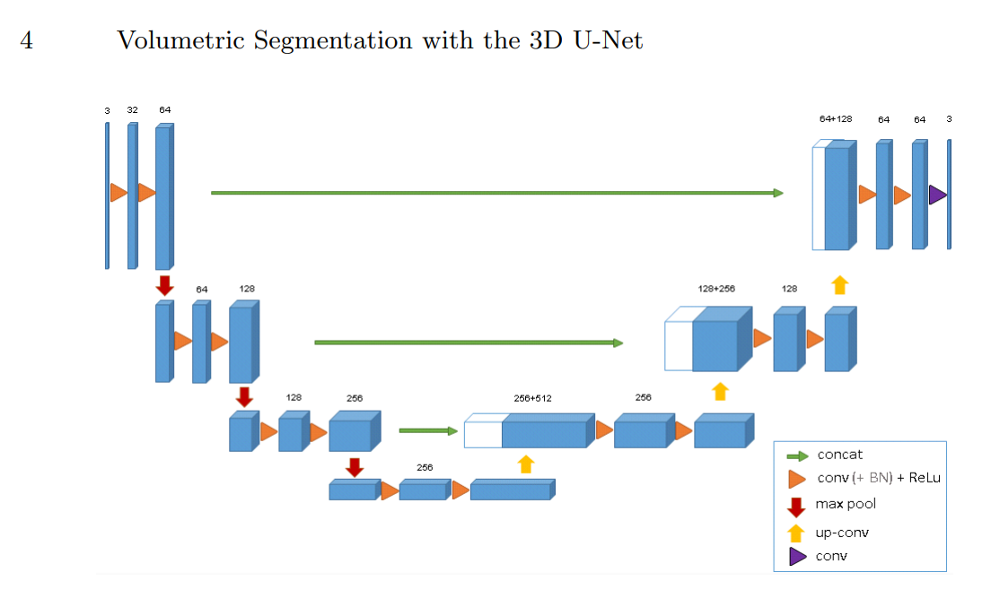

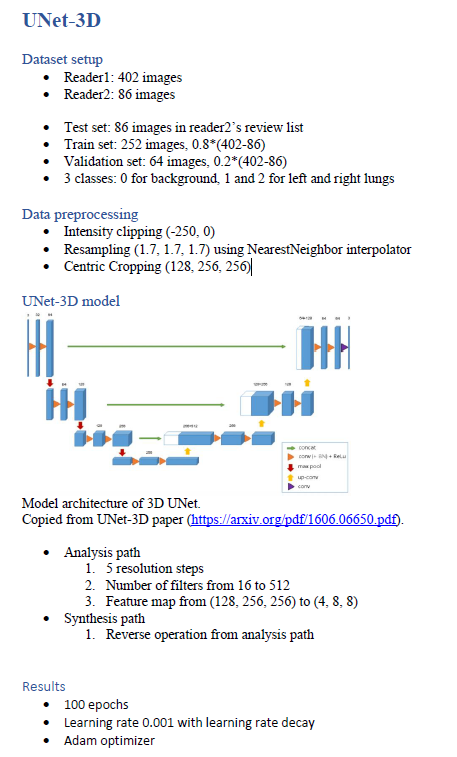
Batch size 1
Evaluation metric: dice coefficient